<a href="https://colab.research.google.com/github/sunrita007/MachineLearning_MiniProject/blob/main/MLEnd_2022_Starter_kit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment set up

In this section we will set up a Colab environment for the MLEnd mini-project. Before starting, follow these simple instructions: 

1.   Go to https://drive.google.com/
2.   Create a folder named 'Data' in 'MyDrive': On the left, click 'New' > 'Folder', enter the name 'Data', and click 'create'
3.   Open the 'Data' folder and create a folder named 'MLEndLS'.

Let's start by loading a few useful Python libraries and mounting our personal Google Drive storage system (i.e. making it available, so that Colab can access it).

In [1]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data download

In this section we will download a small subsample of the MLEnd London Sounds Dataset. 

You should be able to download the entire training dataset when it is made available using a similar approach to the one used here for the small sample. As you will see, you only need to provide a different link. Please note that even though we call it "training" dataset you can do whatever you want with it (for instance validate a set of models). We have kept a separate private dataset for testing purposes, which we won't share with anyone.

First, let's define a function that will allow us to download a file into a chosen location.

In [2]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

The next step is to download the file 'MLEndLS_Sample.zip' into the folder 'MyDrive/Data/MLEndLS'. Note that this might take a while!

In [3]:
#url  = "https://collect.qmul.ac.uk/down?t=610I73D2G2RLS4BI/R8RDLM2R3O9FHEMR92GKGR0"
#save_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_Sample.zip'
#download_url(url, save_path)

Run the following cell to check that the MLEndLS folder contains the file 'MLEndLS_Sample.zip':

In [3]:
path = '/content/drive/MyDrive/Data/MLEndLS'
os.listdir(path)

['1501.wav',
 '1502.wav',
 '1503.wav',
 '1504.wav',
 '1505.wav',
 '1506.wav',
 '1507.wav',
 '1508.wav',
 '1509.wav',
 '1510.wav',
 '1511.wav',
 '1512.wav',
 '1513.wav',
 '1514.wav',
 '1515.wav',
 '1516.wav',
 '1517.wav',
 '1518.wav',
 '1519.wav',
 '1520.wav',
 '1521.wav',
 '1522.wav',
 '1523.wav',
 '1524.wav',
 '1525.wav',
 '1526.wav',
 '1527.wav',
 '1528.wav',
 '1529.wav',
 '1530.wav',
 '1531.wav',
 '1532.wav',
 '1533.wav',
 '1534.wav',
 '1535.wav',
 '1536.wav',
 '1537.wav',
 '1538.wav',
 '1539.wav',
 '1540.wav',
 '1541.wav',
 '1542.wav',
 '1543.wav',
 '1544.wav',
 '1545.wav',
 '1546.wav',
 '1547.wav',
 '1548.wav',
 '1549.wav',
 '1550.wav',
 '1551.wav',
 '1552.wav',
 '1553.wav',
 '1554.wav',
 '1555.wav',
 '1556.wav',
 '1557.wav',
 '1558.wav',
 '1559.wav',
 '1560.wav',
 '1561.wav',
 '1562.wav',
 '1563.wav',
 '1564.wav',
 '1565.wav',
 '1566.wav',
 '1567.wav',
 '1568.wav',
 '1569.wav',
 '1570.wav',
 '1571.wav',
 '1572.wav',
 '1573.wav',
 '1574.wav',
 '1575.wav',
 '1576.wav',
 '1577.wav',

# Understanding our dataset sample

Let's unzip the sample data:

In [5]:
#directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/'
#zip_path1 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_1.zip'
#zip_path2 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_2.zip'
#zip_path3 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_3.zip'
#zip_path4 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_4.zip'
#zip_path5 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_5.zip'
#with zipfile.ZipFile(zip_path1, 'r') as zip_ref1:
#    zip_ref1.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path2, 'r') as zip_ref2:
#    zip_ref2.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path3, 'r') as zip_ref3:
#    zip_ref3.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path4, 'r') as zip_ref4:
#    zip_ref4.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path5, 'r') as zip_ref5:
#    zip_ref5.extractall(directory_to_extract_to)


And now check how many audio files we have:

In [4]:
sample_path = '/content/drive/MyDrive/Data/MLEndLS/*.wav'
files = glob.glob(sample_path)
len(files)

2500

This figure (100) corresponds to the number of **items** or **samples** in our dataset. Let's listen to some random audio files:

In [5]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

Can you recognise the filming spot? What can you say about the acoustic environment?

The MLEndLS Dataset is a collection of samples described by 5 attributes:
- Audio
- Area
- Spot
- Whether indoor or outdoor
- Participant

Upload the CSV file 'MLEndLS_Sample.csv'. Then run the next cell to load it into a Pandas DataFrame and print its contents.


In [6]:
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


In [36]:
MLENDLS_df['area_spot'] = MLENDLS_df['area'] + "_" + MLENDLS_df['spot']
MLENDLS_df['area'].value_counts()

campus        823
westend       666
british       404
Euston        234
southbank     229
kensington    144
Name: area, dtype: int64

In [38]:
MLENDLS_df['spot'].value_counts()

square        219
library       174
piazza        151
ground        139
canal         137
curve         136
reception     136
forecourt     122
charing       113
market        112
national      110
trafalgar     109
leicester     106
greatcourt     84
room12         83
street         77
waterloo       41
upper          41
gardens        41
bridge         40
skate          40
food           39
book           36
ritblat        36
royal          33
albert         26
hintze         26
dinosaur       25
marine         24
pond           22
cromwell       21
room13          1
Name: spot, dtype: int64

In [8]:
MLENDLS_df['area'].unique()

array(['british', 'kensington', 'campus', 'westend', 'Euston',
       'southbank'], dtype=object)

In [9]:
MLENDLS_df['spot'].unique()

array(['street', 'dinosaur', 'square', 'hintze', 'piazza', 'upper',
       'canal', 'forecourt', 'greatcourt', 'reception', 'leicester',
       'waterloo', 'room12', 'pond', 'national', 'library', 'skate',
       'market', 'book', 'ground', 'charing', 'trafalgar', 'curve',
       'ritblat', 'bridge', 'marine', 'food', 'albert', 'cromwell',
       'gardens', 'royal', 'room13'], dtype=object)

The audio attribute is a complex one and cannot be directly inserted in a DataFrame structure. Instead, we have the name of the corresponding audio files, e.g. '3086.wav', which in our case are stored in the '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS_Sample/' folder. 

The next cell prints the contents of the folder that stores our sample audio files. You can see that the names of the WAV files correspond to one of the `file_id` entries in the `MLEndLS_df` DataFrame.

In [10]:
for file in files:
  print(file.split('/')[-1])

1501.wav
1502.wav
1503.wav
1504.wav
1505.wav
1506.wav
1507.wav
1508.wav
1509.wav
1510.wav
1511.wav
1512.wav
1513.wav
1514.wav
1515.wav
1516.wav
1517.wav
1518.wav
1519.wav
1520.wav
1521.wav
1522.wav
1523.wav
1524.wav
1525.wav
1526.wav
1527.wav
1528.wav
1529.wav
1530.wav
1531.wav
1532.wav
1533.wav
1534.wav
1535.wav
1536.wav
1537.wav
1538.wav
1539.wav
1540.wav
1541.wav
1542.wav
1543.wav
1544.wav
1545.wav
1546.wav
1547.wav
1548.wav
1549.wav
1550.wav
1551.wav
1552.wav
1553.wav
1554.wav
1555.wav
1556.wav
1557.wav
1558.wav
1559.wav
1560.wav
1561.wav
1562.wav
1563.wav
1564.wav
1565.wav
1566.wav
1567.wav
1568.wav
1569.wav
1570.wav
1571.wav
1572.wav
1573.wav
1574.wav
1575.wav
1576.wav
1577.wav
1578.wav
1579.wav
1580.wav
1581.wav
1582.wav
1583.wav
1584.wav
1585.wav
1586.wav
1587.wav
1588.wav
1589.wav
1590.wav
1591.wav
1592.wav
1593.wav
1594.wav
1595.wav
1596.wav
1597.wav
1598.wav
1599.wav
1600.wav
1601.wav
1602.wav
1603.wav
1604.wav
1605.wav
1606.wav
1607.wav
1608.wav
1609.wav
1610.wav
1611.wav
1

In [33]:
import os
 
# File name
#file = '3133.wav'
 
# File location
#location = "/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS_Sample/"
 
# Path
#path = os.path.join(location, file)
 
# Remove the file
# 'file.txt'
#os.remove(path)

# Feature extraction : Picth

Audio files are complex data types. Specifically they are **discrete signals** or **time series**, consisting of values on a 1D temporal grid. These values are known as *samples* themselves, which might be a bit confusing, as we have used this term to refer to the *items* in our dataset. The **sampling frequency** is the rate at which samples in an audio file are produced. For instance a sampling frequency of 5HZ indicates that 5 produce 5 samples per second, or 1 sample every 0.2 s.

Let's plot one of our audio signals:

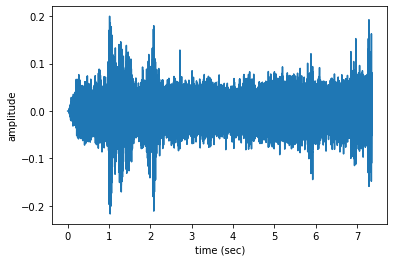

In [11]:
n=0
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

# Feature extraction : Spectral Centroid

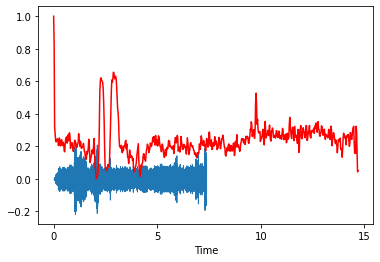

In [13]:
#spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
import sklearn
import librosa.display
spectral_centroids = librosa.feature.spectral_centroid(x, sr= fs)[0]
spectral_centroids.shape
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveshow(x, fs)
plt.plot(t, normalize(spectral_centroids), color='r')

# Feature extraction : Spectral Roll off


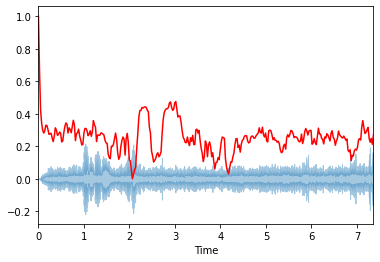

In [16]:
spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=fs)[0]
librosa.display.waveplot(x, sr=fs, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

# Feature extraction : MFCC


(20, 634)


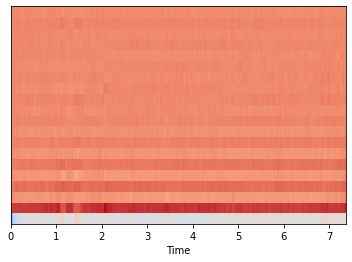

In [17]:
mfccs = librosa.feature.mfcc(x, sr=fs)
print(mfccs.shape)
#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=fs, x_axis='time')

Can you tell whether you are listening to an indoors or outdoors location? Does it agree with the values shown in the ``` MLENDLS_df ``` dataframe? Let's check it:
 

In [18]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area                southbank
spot                     book
in_out                outdoor
Participant              S102
area_spot      southbank_book
Name: 1501.wav, dtype: object

Note that we are using the name of the audio file as the index in the Pandas DataFrame. By changing the value of `n` in the previous cell, you can listen to other examples. If you are doing this during one of our lab sessions, please make sure that your mic is muted!

Exactly, how complex is an audio signal? Let's start by looking at the number of samples (i.e. time series samples) in one of our audio files:

In [14]:
import librosa
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 324576 samples


If we are using a raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. Compare this figure with the number of items (i.e. recordings) that we have. Do we have enough samples to train a model that takes one of these audio signals as an input?

One approach to deal with this huge dimensionality is to extract a few features from our signals and use these features as predictors instead. In this notebook we will use four audio features, namely:


1.   Power.
2.   Pitch - mean.
3.   Pitch - standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal (do not worry if you do not know what it is, but feel free to read about it!).

In [12]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [13]:
spectral_centroids = librosa.feature.spectral_centroid(x,fs)
spectral_centroids.dtype

dtype('float64')

Let's consider the problem of determining whether the filming spot is indoors or outdoors. Then next cell defines a function that takes a collection of audio files together with a CSV file and creates a NumPy array containing the 4 audio features used as predictors (`X`) and a binary label (`y`) that indicates whether the recording is indoors (`y=1`) or outdoors (`y=0`).

In [39]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['area']=='campus'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
    spectral_centroids = librosa.feature.spectral_centroid(x,fs)
    spectral_rolloff = librosa.feature.spectral_rolloff(x,fs)
    mfccs = librosa.feature.mfcc(x,fs)

    #Pitch related calculations 
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    spectral_centroids_mean = np.mean(spectral_centroids)
    spectral_rolloff_mean = np.mean(spectral_rolloff)
    mfccs_mean = np.mean(mfccs)

    xi = [power,pitch_mean,pitch_std,voiced_fr,spectral_centroids_mean,spectral_rolloff_mean,mfccs_mean]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [22]:
files[32]
files[2204]
files[2205]

'/content/drive/MyDrive/Data/MLEndLS/0206.wav'

Let's apply `getXy` to the subsample and obtain the NumPy predictor array (`X`) and a binary label (`y`). This could take a while, as we are processing each of the 100 audio signals. 

In [40]:
#F1 = files[200:300]
X,y = getXy(files[200:300], labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 100/100 [02:32<00:00,  1.53s/it]


The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [41]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)


The shape of X is (100, 7)
The shape of y is (100,)
The labels vector is [False  True False False False False False  True False  True False  True
 False False  True  True  True  True False False False False False  True
 False  True  True  True False  True False False False  True  True False
 False False False False False  True False False False False  True False
  True False  True  True False False  True  True False False  True  True
 False False False  True False  True  True False  True False False False
 False  True  True  True False  True False False  True  True False False
 False  True  True False False  True False False False False False False
 False False False False]


As you can see, we have 100 items consisting of 4 features (stored in `X`) and one binary label (stored in `y`). Is our dataset balanced? Let's have a look:

In [42]:
print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))

 The number of indoor recordings is  37
 The number of outdoor recordings is  63


# Modeling: Support Vector Machines

Let's build a support vector machine (SVM) model for the predictive task of identifying the type of filming spot (indoors/outdoors) using the dataset that we have just created.

We will use the SVM method provided by scikit-learn and will split the dataset defined by X and y into a training set and a validation set.

In [43]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((70, 7), (30, 7), (70,), (30,))

Can you identify the number of items in the training and validation sets?

Let's now fit an SVM model and print both the training accuracty and validation accuracy.


In [44]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.6428571428571429
Validation  Accuracy 0.6
The support vectors are (53, 7)


Compare the training and validation accuracies. Is our model overfitting, underfitting, performing well? What do you think the accuracy of a random classifier would be?

Let's normalise the predictors, to see if the performance improves.


In [31]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.9285714285714286
Validation  Accuracy 0.7666666666666667
The support vectors are (69, 7)


Do you think we have obtained a better solution?

What machine learning pipeline have we implemented for each solution? Feel free to try other machine learning models available in scikit, it's very easy!